# Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
sys.path.insert(1, r'./../functions') # add to pythonpath

#For creating animations and plotting in 3D
from matplotlib import rc
import matplotlib.animation as animation
from JSAnimation import IPython_display
from mpl_toolkits.mplot3d import Axes3D


# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 18 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 20 # fontsize for figure titles
plt.rcParams['font.size'] = 16 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.6 # line width for plotting

In [2]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeEMG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeEMG, waveData

In [3]:
def graph_one(data_series, period = 125, identifier = "xx"):
    time = period*0.1
    n = np.size(data_series)
    plt.figure(2)
    plt. plot(data_series[0: n-period], data_series[period: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    plt.title(r"$t+"+str(time)+"ms$")
    plt.xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    plt.ylabel(y)
    plt.show()
    return None

# Animations

In medicine, the duration of the QRS complex in a healthy heart is considered to be less than 12 ms [Szulewski, 2018]. Notice that when considering a time delay around this value, the attractor’s dynamic unfolds i.e., the cycle is clearly visible.

<img src="ecg_and_attractor.gif" width="750" align="center">

In [4]:
x, y = ecg("S1_rest.wav") #x is time and y is the voltage signal


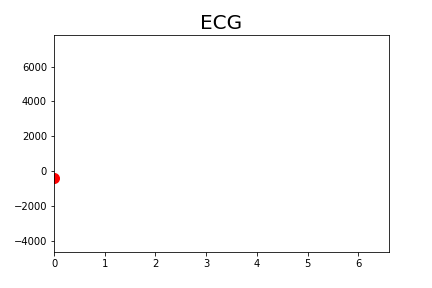
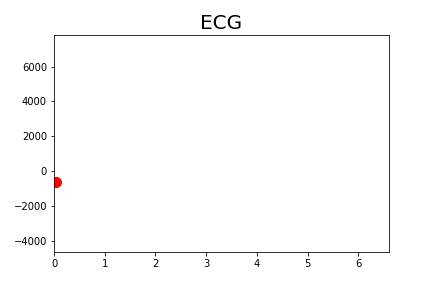
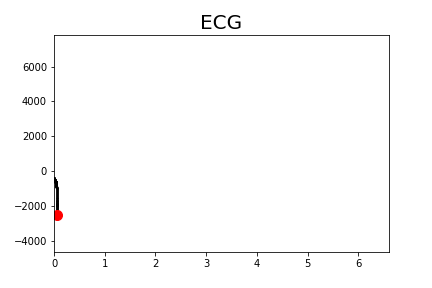
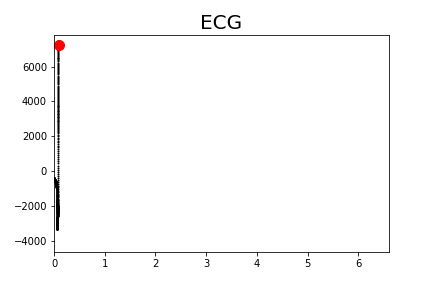
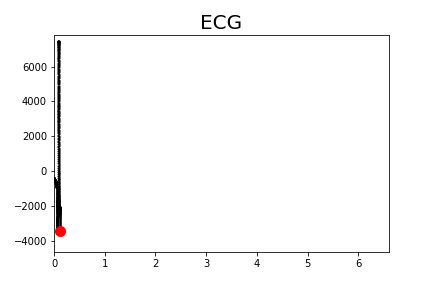
...
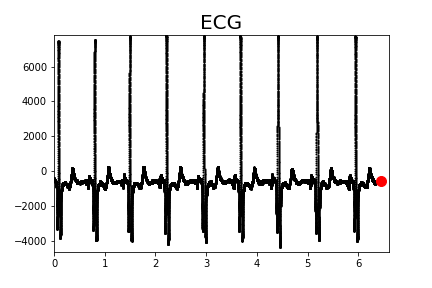
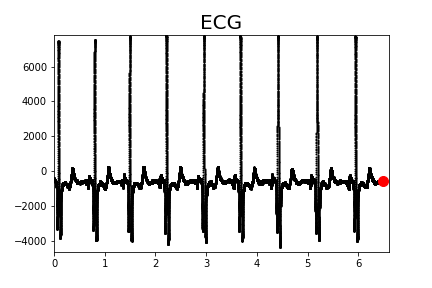
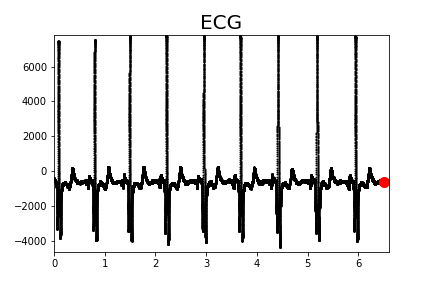
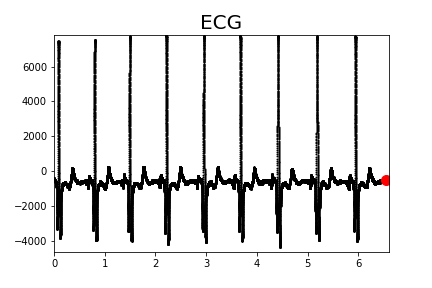
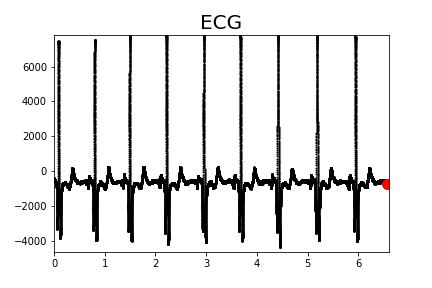

In [5]:
# Ecg animation!
# Based on: https://towardsdatascience.com/animations-with-matplotlib-d96375c5442c
steps = 300 #Number of points between one frame and the next
number_of_frames = 220

fig,ax = plt.subplots() #Using objects
ax.set_xlim((0,x[steps*number_of_frames])),ax.set_ylim((min(y),max(y))) 
ax.set_title("ECG")

#trayectory and particle are pointers
trayectory,=ax.plot([],[],'k.', markersize = 2)
particle,=ax.plot([],[],'ro', markersize=10)

def initialize():
    trayectory.set_data([],[])
    particle.set_data([],[])
    return(trayectory,particle,)

def animate(i):
    trayectory.set_data(x[:i*steps], y[:i*steps])
    particle.set_data(x[i*steps],y[i*steps])    
    return(trayectory,particle,)

animation.FuncAnimation(fig, animate, init_func=initialize,
                               frames=number_of_frames, interval=40, blit=True)


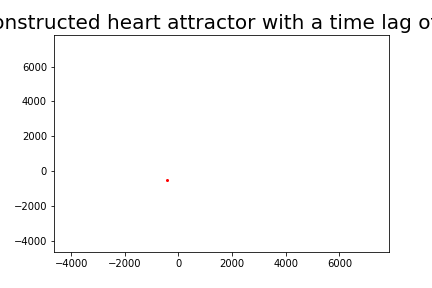
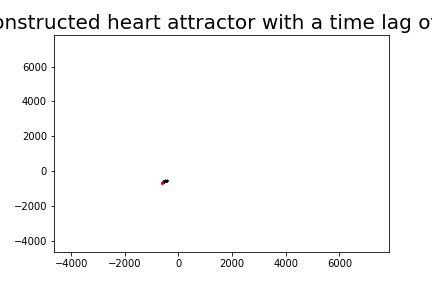
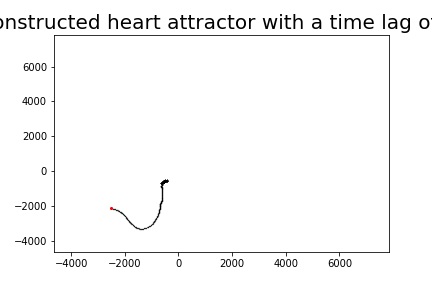
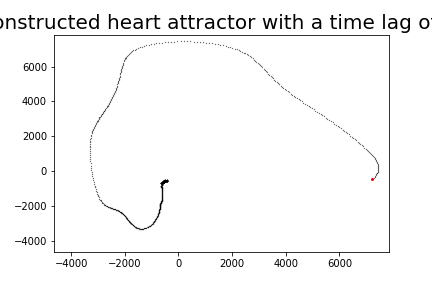
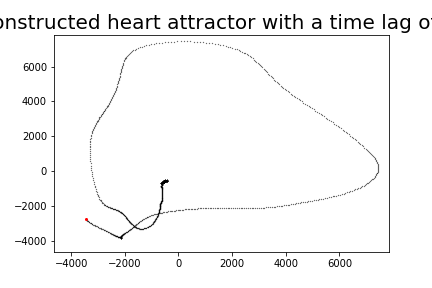
...
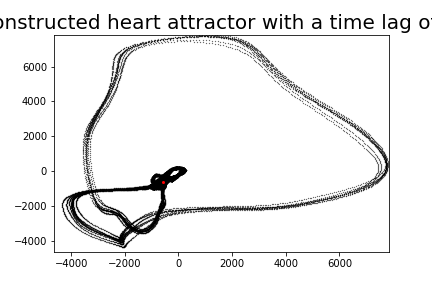
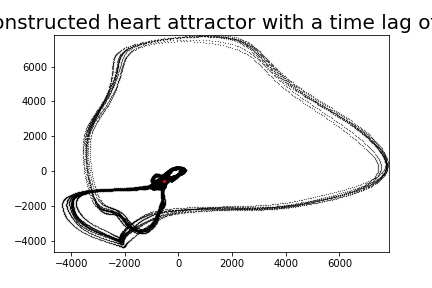
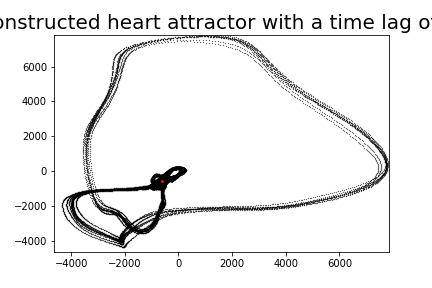
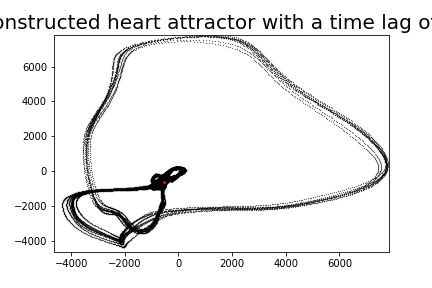
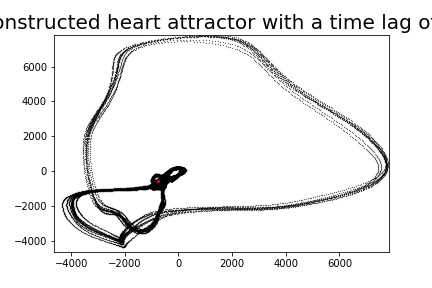

In [6]:
# Reconstructed attractor animation!

period = 125
time = period*0.1
steps = 300 #Number of points between one frame and the next
number_of_frames = 220

fig,ax = plt.subplots() #Manejo de objetos
ax.set_xlim((min(y),max(y))),ax.set_ylim((min(y),max(y))) #A una variable le pegas una funcion
ax.set_title("Reconstructed heart attractor with time lag of "+str(time))

#trayectoria y bolita son apuntadores
trayectory, = ax.plot([],[],'k.', markersize = 0.5)
particle, = ax.plot([],[],'ro', markersize=2)

def initialize():
    trayectory.set_data([],[])
    particle.set_data([],[])
    return(trayectory,particle,)

def animate(i):
    trayectory.set_data(y[:i*steps], y[period:i*steps+period])
    particle.set_data(y[i*steps],y[i*steps+period])    
    return(trayectory,particle,)

animation.FuncAnimation(fig, animate, init_func=initialize,
                               frames=number_of_frames, interval=40, blit=True)

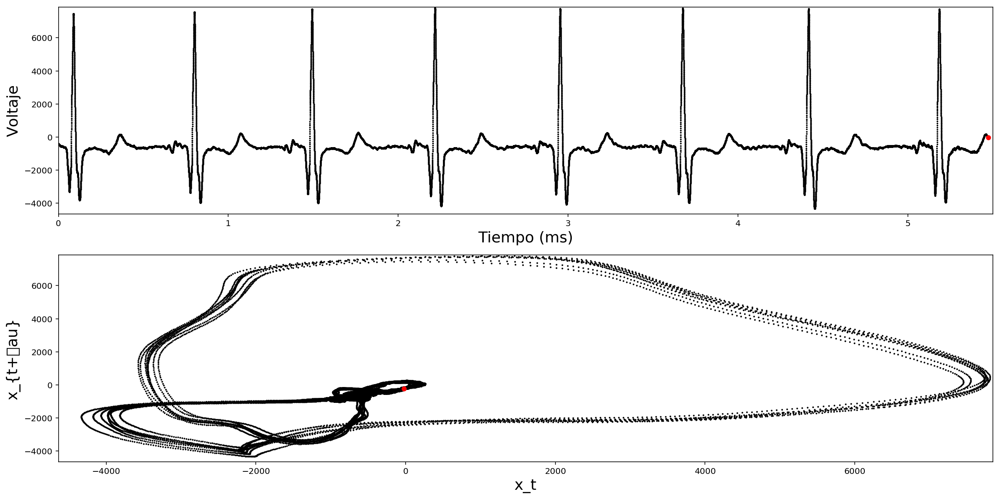

In [9]:
#https://pythonmatplotlibtips.blogspot.com/2018/01/combine-two-2d-animations-in-one-figure-matplotlib-artistanimation.html

period = 125 #Time delay for reconstructing attractor
num_frames = 220 #Number of iterations for animation
steps = 250 #Number of steps the animation will skip for red marker

#Initializing the graphic space
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)
# ejes.set_title("Tiempo: "+str(x[i*steps]*0.1)+"ms")
    

#ECG
ax1.set_ylabel('Voltaje')
ax1.set_xlabel('Tiempo (ms)')
ax1.set_xlim((0,x[steps*number_of_frames])),ax.set_ylim((min(y),max(y))) 
ax1.set_ylim([min(y), max(y)])
trayectory_ecg, = ax1.plot([], [], 'k.', markersize=2)
particle_ecg, = ax1.plot([],[],'ro', markersize=5)

#Atractor reconstruido
ax2.set_xlabel(u'x_t')
ax2.set_ylabel(u'x_{t+\tau}')
ax2.set_xlim([min(y), max(y)])
ax2.set_ylim([min(y), max(y)])
trayectory, = ax2.plot([],[],'k.', label="ecg", markersize = 2)
particle, = ax2.plot([],[],'ro', markersize=5)

def initialize():
    trayectory_ecg.set_data([],[])
    particle_ecg.set_data([],[])
    trayectory.set_data([],[])
    particle.set_data([],[])
    return(trayectory_ecg,particle_ecg,trayectory, particle)

def animate(i):
    trayectory_ecg.set_data(x[:i*steps], y[:i*steps])
    particle_ecg.set_data(x[i*steps],y[i*steps])   
    trayectory.set_data(y[:i*steps], y[period:i*steps+period])
    particle.set_data(y[i*steps],y[i*steps+period])    
    return(trayectory_ecg,particle_ecg,trayectory, particle)

anim = animation.FuncAnimation(fig, animate, init_func=initialize,
                               frames=num_frames, interval=40, blit=True)

anim.save('ecg_and_attractor_rest.gif', writer='pillow')

# animation.FuncAnimation(fig, animar, init_func=inicio,
#                                frames=220, interval=40, blit=True)

In [10]:
x, y = ecg("S1_exercise.wav") #x is time and y is the voltage signal

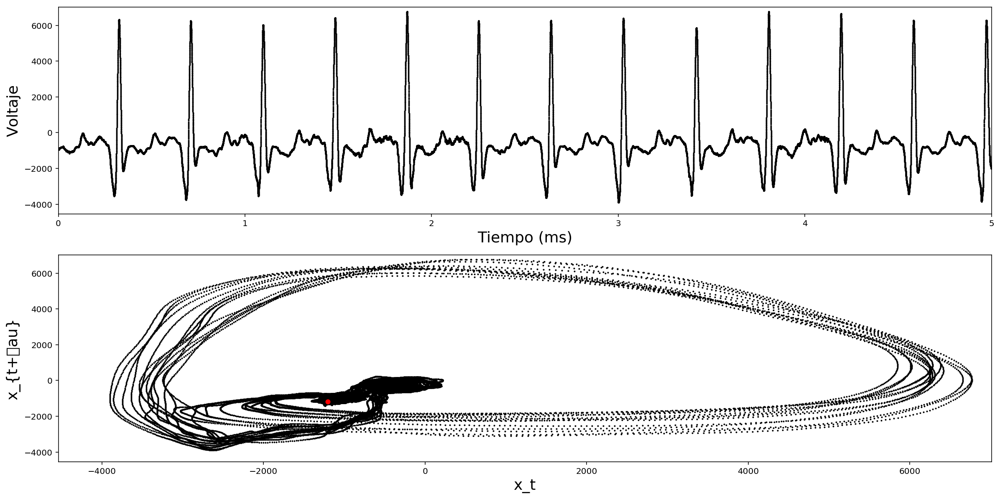

In [12]:
#https://pythonmatplotlibtips.blogspot.com/2018/01/combine-two-2d-animations-in-one-figure-matplotlib-artistanimation.html

period = 125 #Time delay for reconstructing attractor
num_frames = 220 #Number of iterations for animation
steps = 250 #Number of steps the animation will skip for red marker

#Initializing the graphic space
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)
# ejes.set_title("Tiempo: "+str(x[i*steps]*0.1)+"ms")
    

#ECG
ax1.set_ylabel('Voltaje')
ax1.set_xlabel('Tiempo (ms)')
ax1.set_xlim([0, 5])
ax1.set_ylim([min(y), max(y)])
trayectory_ecg, = ax1.plot([], [], 'k.', markersize=2)
particle_ecg, = ax1.plot([],[],'ro', markersize=5)

#Atractor reconstruido
ax2.set_xlabel(u'x_t')
ax2.set_ylabel(u'x_{t+\tau}')
ax2.set_xlim([min(y), max(y)])
ax2.set_ylim([min(y), max(y)])
trayectory, = ax2.plot([],[],'k.', label="ecg", markersize = 2)
particle, = ax2.plot([],[],'ro', markersize=5)

def initialize():
    trayectory_ecg.set_data([],[])
    particle_ecg.set_data([],[])
    trayectory.set_data([],[])
    particle.set_data([],[])
    return(trayectory_ecg,particle_ecg,trayectory, particle)

def animate(i):
    trayectory_ecg.set_data(x[:i*steps], y[:i*steps])
    particle_ecg.set_data(x[i*steps],y[i*steps])   
    trayectory.set_data(y[:i*steps], y[period:i*steps+period])
    particle.set_data(y[i*steps],y[i*steps+period])    
    return(trayectory_ecg,particle_ecg,trayectory, particle)

anim = animation.FuncAnimation(fig, animate, init_func=initialize,
                               frames=num_frames, interval=40, blit=True)

anim.save('ecg_and_attractor_exercise.gif', writer='pillow')

# animation.FuncAnimation(fig, animar, init_func=inicio,
#                                frames=220, interval=40, blit=True)